<a href="https://colab.research.google.com/github/charlessantarosa/detection-object-yolo/blob/master/main_presents.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# Bibliotecas

import torch
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.inception_v3 import preprocess_input
from keras.utils.data_utils import GeneratorEnqueuer
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np 
import math, os
from IPython.display import Image

%matplotlib inline

In [3]:
# Clean
!rm -rf /content/src/

In [4]:
# Global Vars

DIR_DEFAULT = '/content'
DIR_ROOT = DIR_DEFAULT + '/src'

!mkdir $DIR_ROOT

In [5]:
os.chdir(DIR_ROOT)

In [6]:
# Yolov5

# !rm -rf /content/yolov5/

!git clone https://github.com/ultralytics/yolov5 && \
  cd yolov5 && \
  pip install -r requirements.txt

# Install
# !pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 10008, done.
remote: Total 10008 (delta 0), reused 0 (delta 0), pack-reused 10008
Receiving objects: 100% (10008/10008), 10.29 MiB | 30.71 MiB/s, done.
Resolving deltas: 100% (6936/6936), done.
     |████████████████████████████████| 596 kB 9.8 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [7]:
# Dataset Roboflow

# Clean 
%rm -rf $DIR_ROOT/yolov5/test
%rm -rf $DIR_ROOT/yolov5/train
%rm -rf $DIR_ROOT/yolov5/valid
%rm -rf $DIR_ROOT/yolov5/data.yaml
%rm -rf $DIR_ROOT/yolov5/README.dataset.txt
%rm -rf $DIR_ROOT/yolov5/README.roboflow.txt

%cd $DIR_ROOT/yolov5
!curl -L "https://app.roboflow.com/ds/cPHhcxN59H?key=NWXdh6zbW9" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip



/content/src/yolov5
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1224      0 --:--:-- --:--:-- --:--:--  1224
100 2324k  100 2324k    0     0  2675k      0 --:--:-- --:--:-- --:--:-- 2675k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/coca5_jpg.rf.ae811c681adbdc4793769f875ec73756.jpg  
 extracting: test/images/fanta11_jpeg.rf.8914538afbf4a29e30f6448d6d20c11b.jpg  
 extracting: test/images/fanta3_jpg.rf.b91fc608a7a533f16b57897bccaf43f9.jpg  
 extracting: test/images/misc11_jpg.rf.b89250ef3ae801e5eaaa2c01df509a02.jpg  
 extracting: test/images/misc15_jpg.rf.9c4e70842da5575753301c51a991d1d6.jpg  
   creating: test/labels/
 extracting: test/labels/coca5_jpg.rf.ae811c681adbdc4793769f875ec

In [8]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['coca-cola', 'fanta']

In [9]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [10]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [11]:
# # Below we are changing the data configuration for right path to the dataset
%%writetemplate ./data.yaml

train: ./train/images
val: ./valid/images

nc: 2
names: ['coca-cola', 'fanta']

In [12]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [13]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))

Number of Classes are 2, whose labels are ['coca-cola', 'fanta'] for this Object Detection project


In [14]:
# !pwd
!ls -la /content/src/yolov5/models/

total 100
drwxr-xr-x  3 root root  4096 Nov  7 05:24 .
drwxr-xr-x 10 root root  4096 Nov  7 05:24 ..
-rw-r--r--  1 root root 20114 Nov  7 05:24 common.py
-rw-r--r--  1 root root  4584 Nov  7 05:24 experimental.py
drwxr-xr-x  2 root root  4096 Nov  7 05:24 hub
-rw-r--r--  1 root root     0 Nov  7 05:24 __init__.py
-rw-r--r--  1 root root 20658 Nov  7 05:24 tf.py
-rw-r--r--  1 root root 15246 Nov  7 05:24 yolo.py
-rw-r--r--  1 root root  1401 Nov  7 05:24 yolov5l.yaml
-rw-r--r--  1 root root  1403 Nov  7 05:24 yolov5m.yaml
-rw-r--r--  1 root root  1403 Nov  7 05:24 yolov5n.yaml
-rw-r--r--  1 root root  1403 Nov  7 05:24 yolov5s.yaml
-rw-r--r--  1 root root  1403 Nov  7 05:24 yolov5x.yaml


In [15]:
%cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [16]:
# Below we are changing the configuration so that it becomes compatible to number of classes required in this project
%%writetemplate models/custom_yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 2  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [17]:
%%time
!python train.py --img 416 --batch 80 --epochs 200 --data './data.yaml' --cfg models/custom_yolov5s.yaml #--weights ''

train: weights=yolov5s.pt, cfg=models/custom_yolov5s.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=200, batch_size=80, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees

# Resultados

In [18]:
!ls -la runs/train/exp

total 4056
drwxr-xr-x 3 root root    4096 Nov  7 05:30 .
drwxr-xr-x 3 root root    4096 Nov  7 05:25 ..
-rw-r--r-- 1 root root   92737 Nov  7 05:30 confusion_matrix.png
-rw-r--r-- 1 root root 1062661 Nov  7 05:30 events.out.tfevents.1636262725.761cb650f7a3.373.0
-rw-r--r-- 1 root root  141890 Nov  7 05:30 F1_curve.png
-rw-r--r-- 1 root root     372 Nov  7 05:25 hyp.yaml
-rw-r--r-- 1 root root  227518 Nov  7 05:25 labels_correlogram.jpg
-rw-r--r-- 1 root root  192675 Nov  7 05:25 labels.jpg
-rw-r--r-- 1 root root     608 Nov  7 05:25 opt.yaml
-rw-r--r-- 1 root root  120959 Nov  7 05:30 P_curve.png
-rw-r--r-- 1 root root   78281 Nov  7 05:30 PR_curve.png
-rw-r--r-- 1 root root  103592 Nov  7 05:30 R_curve.png
-rw-r--r-- 1 root root   59094 Nov  7 05:30 results.csv
-rw-r--r-- 1 root root  250111 Nov  7 05:30 results.png
-rw-r--r-- 1 root root  383035 Nov  7 05:25 train_batch0.jpg
-rw-r--r-- 1 root root  391290 Nov  7 05:25 train_batch1.jpg
-rw-r--r-- 1 root root  416657 Nov  7 05:25 train

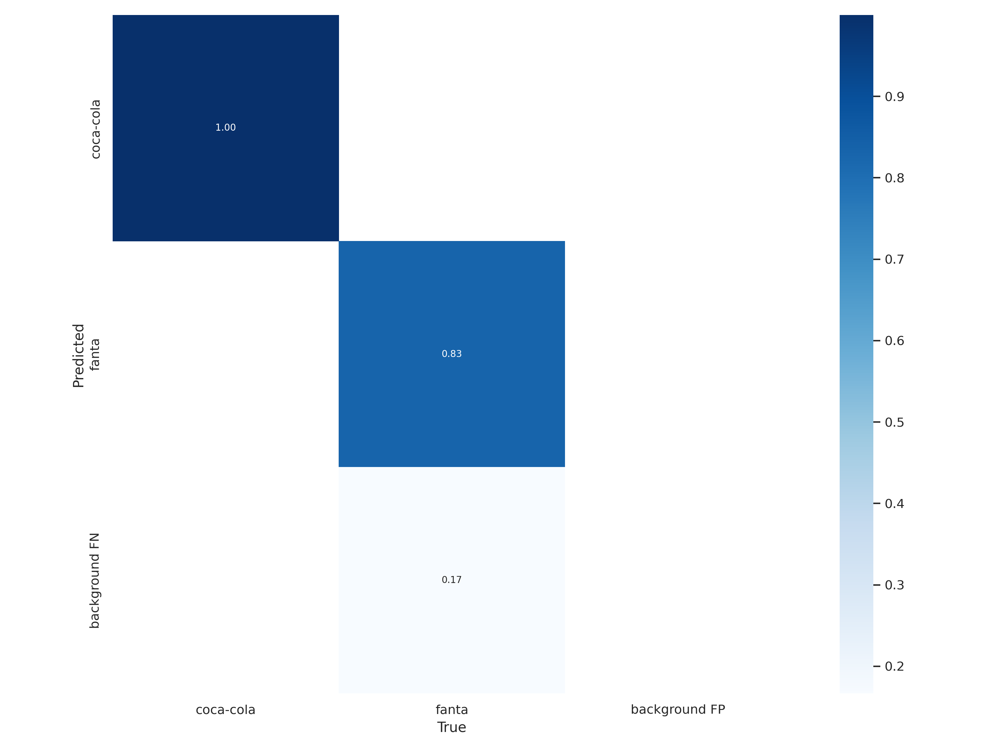

In [20]:
Image(filename='runs/train/exp/confusion_matrix.png', width=1000)

In [21]:
# Tensor Board
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

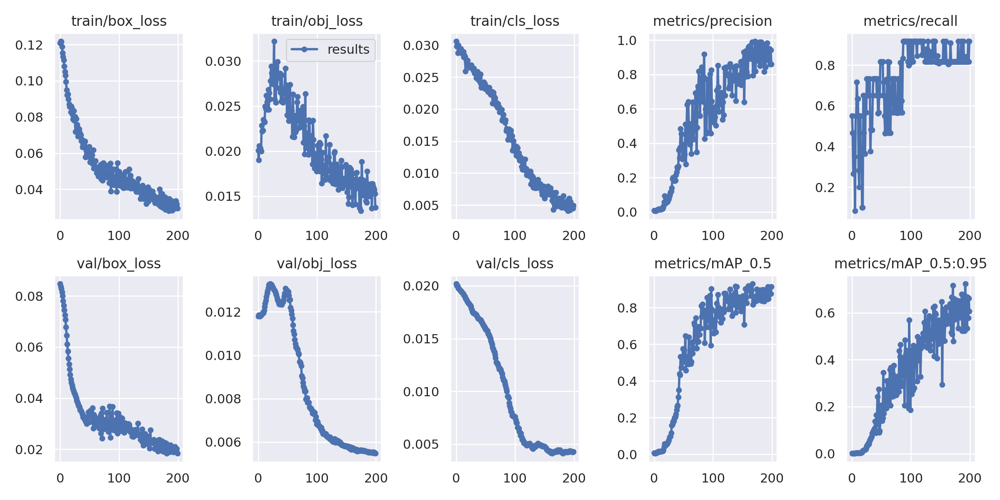

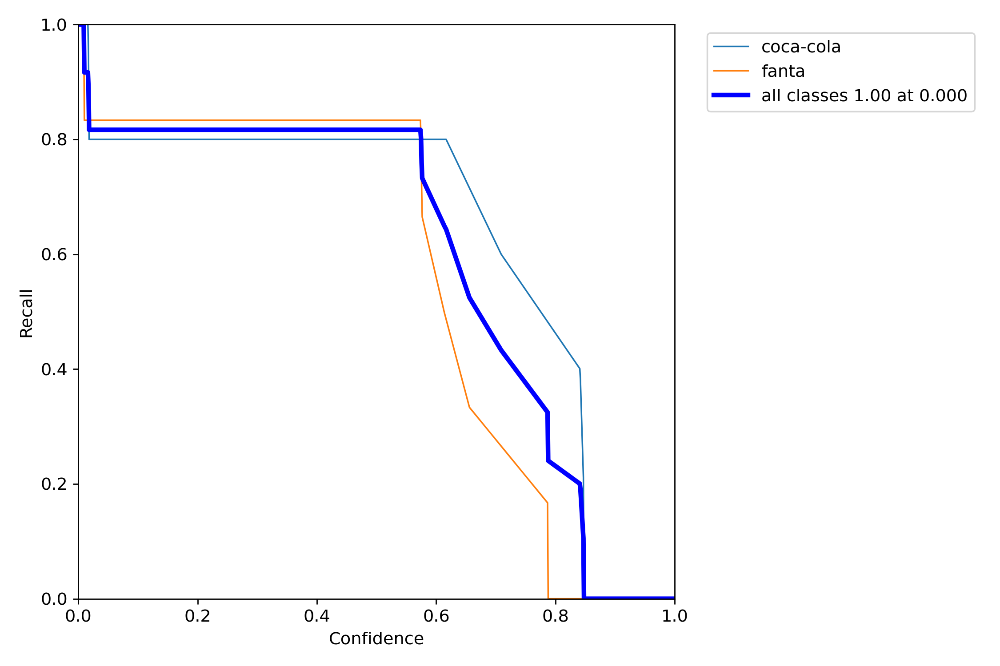

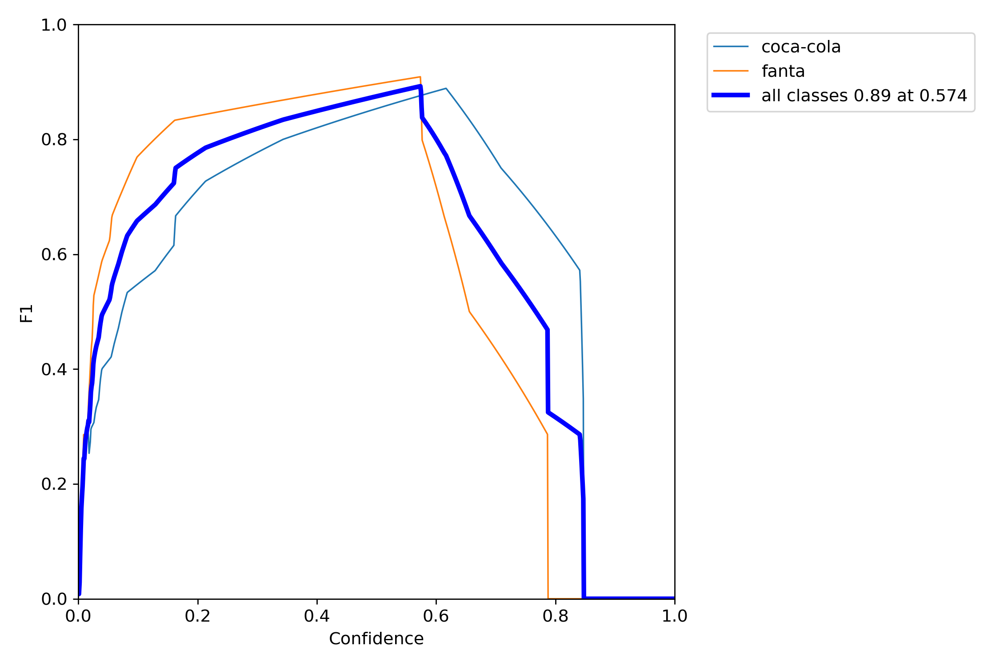

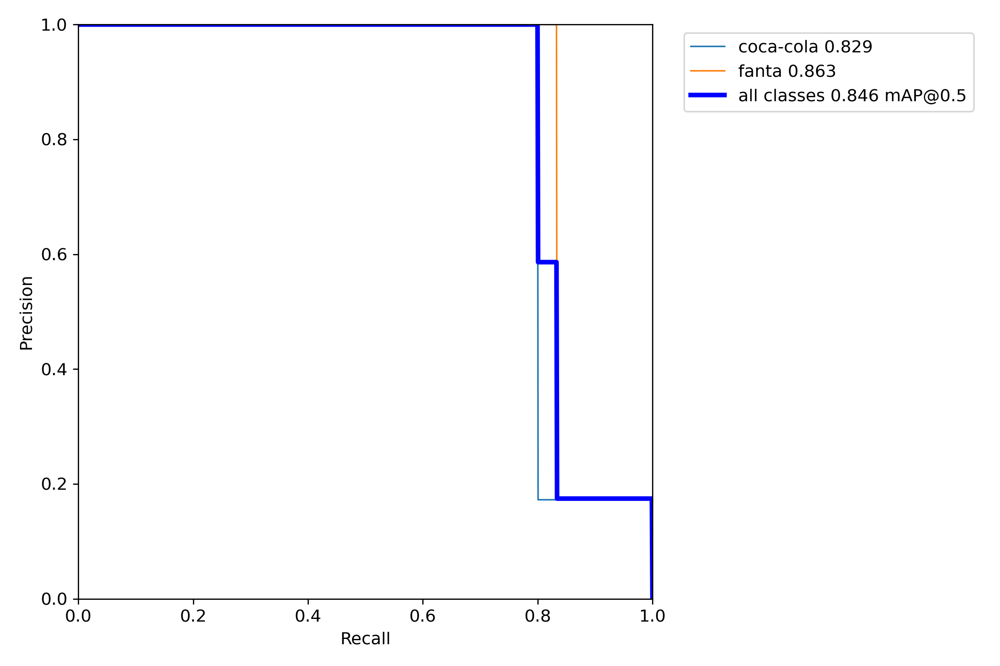

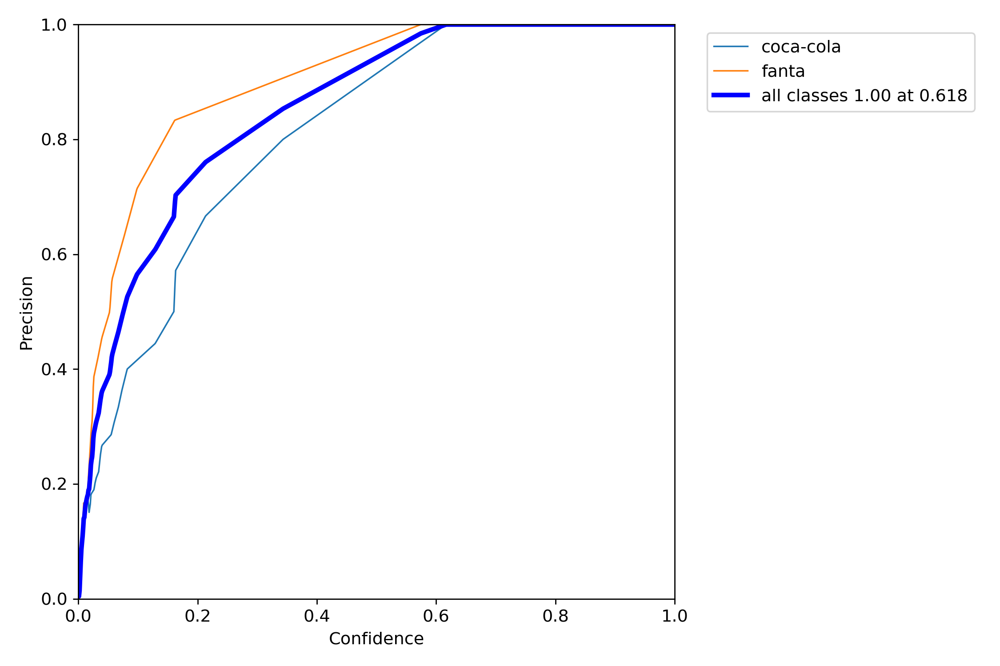

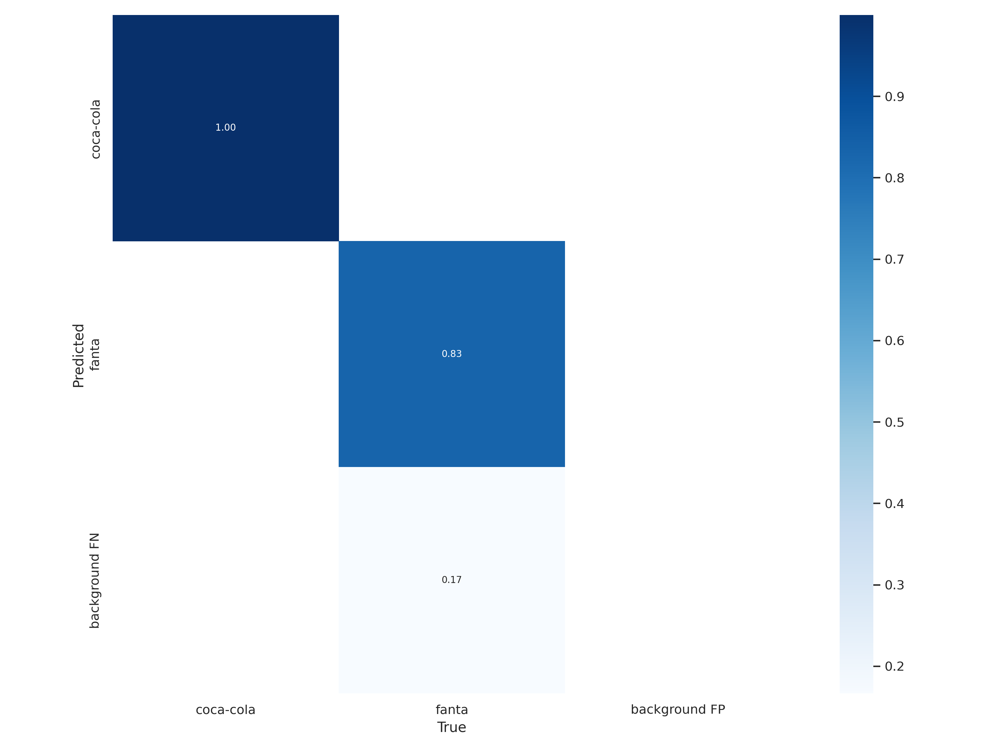

In [24]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/train/exp/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [23]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.4 --source '/content/drive/MyDrive/Publico/Datasets/evaluation'

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/Publico/Datasets/evaluation, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/66 /content/drive/MyDrive/Publico/Datasets/evaluation/1.jpg: 320x416 5 coca-colas, 5 fantas, Done. (0.013s)
image 2/66 /content/drive/MyDrive/Publico/Datasets/evaluation/2.jpg: 320x416 2 coca-colas, 5 fantas, Done. (0.007s)
image 3/66 /content/drive/MyDrive/Publico/Datasets/evaluation/3.jpg: 320x416 5 coca-colas, Done. (0.008s)
image 4/66 /content/

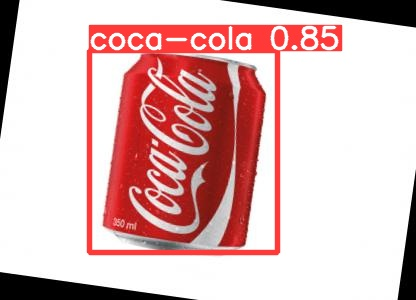

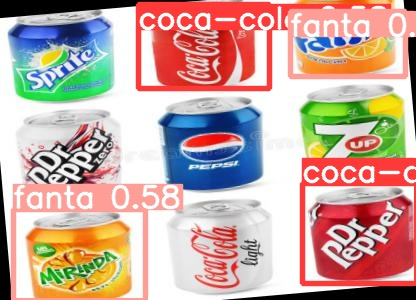

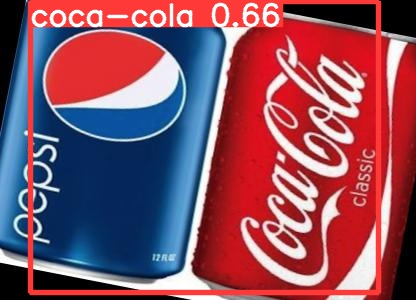

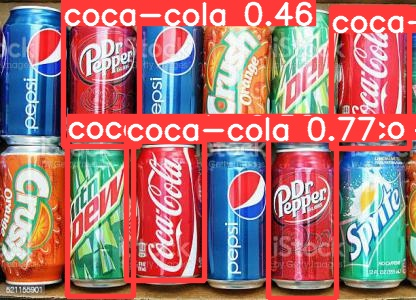

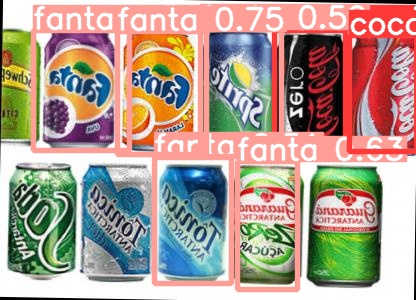

...

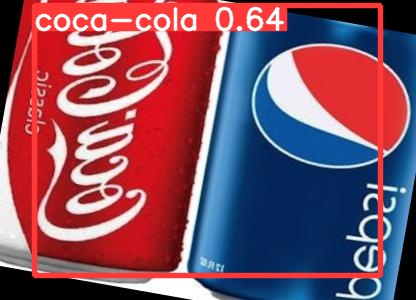

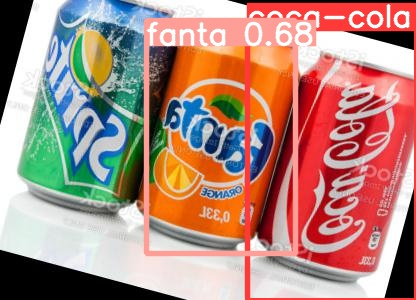

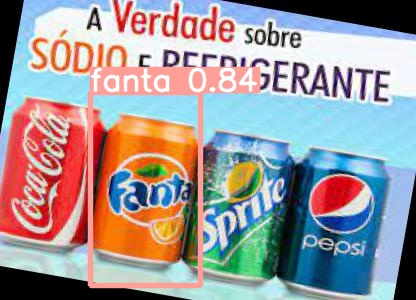

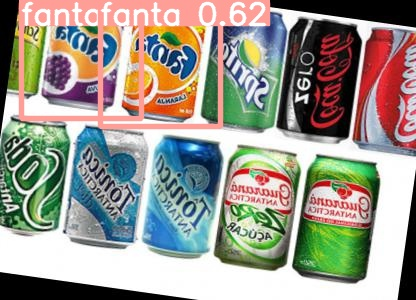

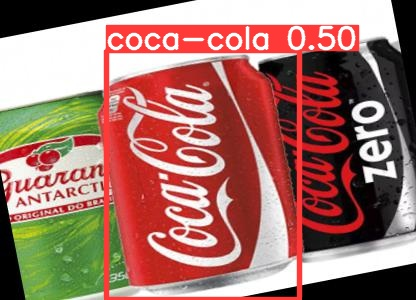

In [25]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")